# Introduction to OpenAI Gymnasium with CartPole

Before diving into policy gradient algorithms, let's get familiar with OpenAI Gymnasium using a simple environment: **CartPole**.

## Goals
* Understand the Gymnasium API
* Connect MDP theory to a concrete environment
* Practice implementing simple agents
* Understand the environment-agent interaction loop


## What is CartPole?

CartPole is a classic reinforcement learning problem. A pole is attached to a cart that moves along a frictionless track. The goal is to keep the pole balanced upright by moving the cart left or right.

Documentation: https://gymnasium.farama.org/environments/classic_control/cart_pole/

# 
# ![CartPole Animation](https://gymnasium.farama.org/_images/cart_pole.gif)
# 


In [12]:
!pip install "gymnasium[classic-control]" numpy matplotlib ipython -q

In [13]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
from typing import Callable

## CartPole as a Markov Decision Process (MDP)

Recall from the [Policy Gradient notebook](policygradient.ipynb) that an MDP is defined as a tuple $(S, A, P, R, \gamma)$:

* **$S$**: The set of possible states
* **$A$**: The set of possible actions
* **$P$**: Transition probabilities $P_a(s, s') = \Pr(s_{t+1} = s' | s_t = s, a_t = a)$
* **$R$**: Reward function $R_a(s, s')$
* **$\gamma$**: Discount factor

Let's see how CartPole maps to this framework:


In [14]:
# Create the CartPole environment
env = gym.make("CartPole-v1")

print("Observation Space:", env.observation_space)
print("Action Space:", env.action_space)
print("")
print("Number of actions:", env.action_space.n)


Observation Space: Box([-4.8               -inf -0.41887903        -inf], [4.8               inf 0.41887903        inf], (4,), float32)
Action Space: Discrete(2)

Number of actions: 2


### Understanding the MDP Components

**State Space ($S$)**: A 4-dimensional continuous vector:
1. Cart position
2. Cart velocity
3. Pole angle (in radians)
4. Pole angular velocity

**Action Space ($A$)**: Discrete with 2 choices:
* `0`: Push cart to the left
* `1`: Push cart to the right

**Transition Function ($P$)**: The physics of the cart-pole system (handled by the environment)

**Reward Function ($R$)**: +1 reward for every timestep the pole remains upright

**Discount Factor ($\gamma$)**: We'll set this ourselves when training agents (typically 0.95-0.99)


## The Environment-Agent Loop

The fundamental interaction pattern in RL:

```
1. Environment provides initial observation
2. Agent selects an action based on observation
3. Environment executes the action
4. Environment returns: next observation, reward, done flags
5. Repeat until episode ends
```

Let's see this in action:


In [15]:
# Reset the environment to get initial observation
observation, info = env.reset(seed=42)
print(f"Initial observation: {observation}")
print("")

# Take a single step
action = 1  # Push right
observation, reward, terminated, truncated, info = env.step(action)

print(f"After taking action {action}:")
print(f"  New observation: {observation}")
print(f"  Reward: {reward}")
print(f"  Terminated: {terminated}")
print(f"  Truncated: {truncated}")

env.close()

Initial observation: [ 0.0273956  -0.00611216  0.03585979  0.0197368 ]

After taking action 1:
  New observation: [ 0.02727336  0.18847767  0.03625453 -0.26141977]
  Reward: 1.0
  Terminated: False
  Truncated: False


### Key Gymnasium API Functions

1. **`reset()`**: Resets environment to initial state, returns `(observation, info)`

2. **`step(action)`**: Executes an action, returns `(observation, reward, terminated, truncated, info)`
   - `terminated`: Episode ended due to failure conditions
   - `truncated`: Episode ended due to time limit

3. **`action_space`**: Describes valid actions

4. **`observation_space`**: Describes the observation format


## Helper Functions

(We can just run them) - they render and plot stats about the running trajectories, respectively. :)

In [16]:
def render_episode(agent: Callable[[np.ndarray], int], agent_name: str = "Agent"):
    """
    Render an episode as an animation in the notebook.
    """
    env = gym.make("CartPole-v1", render_mode="rgb_array")
    
    frames = []
    observation, info = env.reset()
    frames.append(env.render())
    
    total_reward = 0
    for step in range(500):
        action = agent(observation)
        observation, reward, terminated, truncated, info = env.step(action)
        frames.append(env.render())
        total_reward += reward
        
        if terminated or truncated:
            break
    
    env.close()
    
    # Create animation
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.set_title(f"{agent_name} (Total Reward: {total_reward})")
    ax.axis('off')
    
    img = ax.imshow(frames[0])
    
    def animate(i):
        img.set_array(frames[i])
        return [img]
    
    anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, blit=True)
    plt.close()
    
    return HTML(anim.to_jshtml())


We can also plot statistics about the episode:


In [17]:
def plot_episode_stats(agent: Callable, agent_name: str):
    """
    Plot the pole angle and cart position over an episode.
    """
    env = gym.make("CartPole-v1")
    observations, actions, rewards, total_reward = run_episode(env, agent)
    env.close()
    
    observations = np.array(observations)
    cart_positions = observations[:, 0]
    pole_angles = observations[:, 2]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6))
    
    ax1.plot(cart_positions, linewidth=2)
    ax1.set_ylabel('Cart Position', fontsize=11)
    ax1.set_title(f'{agent_name} - Episode Performance (Total Reward: {total_reward})', fontsize=13)
    ax1.grid(True, alpha=0.3)
    
    ax2.plot(pole_angles, linewidth=2, color='orange')
    ax2.axhline(y=0, color='gray', linestyle='-', alpha=0.3)
    ax2.set_xlabel('Timestep', fontsize=11)
    ax2.set_ylabel('Pole Angle (radians)', fontsize=11)
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


## Running Episodes and Collecting Trajectories

Here's a function to run a complete episode and collect the trajectory:

As an exercise, replace the '???' with comments denoting what each step does.

In [18]:
def run_episode(env: gym.Env, agent: Callable[[np.ndarray], int], max_steps: int = 500) -> tuple[list, list, list, float]:
    """
    Run a single episode using the given agent.
    
    Args:
        env: Gymnasium environment
        agent: Function that takes observation and returns action
        max_steps: Maximum steps per episode
        
    Returns:
        observations: List of observations
        actions: List of actions taken
        rewards: List of rewards received
        total_reward: Sum of all rewards
    """
    observations = []
    actions = []
    rewards = []
    
    # Reset the environment to get the initial observation
    observation, info = env.reset()
    
    for step in range(max_steps):
        observations.append(observation)
        
        # Agent selects an action based on the current observation
        action = agent(observation)
        actions.append(action)
        
        # Environment executes the action and returns the next observation, reward, and done flags
        observation, reward, terminated, truncated, info = env.step(action)
        rewards.append(reward)
        
        # Check if the episode is done (either terminated or truncated)
        if terminated or truncated:
            break
    
    total_reward = sum(rewards)
    return observations, actions, rewards, total_reward


# Exercises: Simple Agents

Now it's your turn! To validate that our environment works as a MDP, try a few simple agent strategies and see how they perform.


## Exercise 1: Random Agent

Implement an agent that randomly selects actions from the action space.


In [19]:
def random_agent(observation: np.ndarray) -> int:
    """
    Agent that randomly samples from the action space.
    
    Args:
        observation: Current observation from environment (not used by this agent)
        
    Returns:
        action: Random action (0 or 1)
    """
    return np.random.randint(0, 2)  # Randomly choose 0 or 1

In [20]:
# Render the random agent
render_episode(random_agent, "Random Agent")


/home/will/miniconda3/envs/torch/lib/python3.11/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1342:(snd_func_refer) error evaluating name
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5727:(snd_config_expand) Evaluate error: No such file or directory
ALSA l

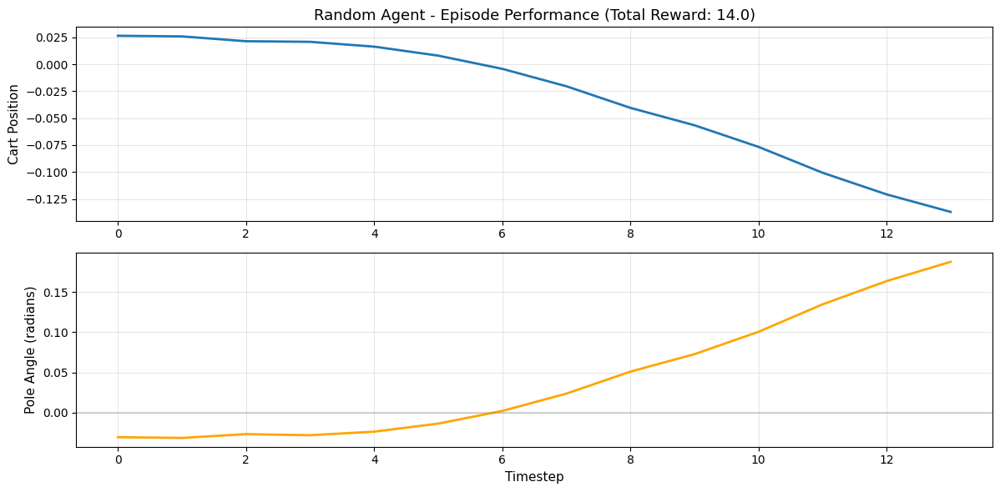

In [21]:
# Plot statistics
plot_episode_stats(random_agent, "Random Agent")

## Exercise 2: Constant Action Agent

Implement an agent that always takes the same action (e.g., always pushes left).

In [22]:
def constant_agent(observation: np.ndarray) -> int:
    """
    Agent that always takes the same action.
    
    Args:
        observation: Current observation from environment
        
    Returns:
        action: Always returns the same action (choose 0 or 1)
    """
    return 0  # Always push left (you could also try 1 for always right)


In [23]:
# Render the constant agent
render_episode(constant_agent, "Constant Agent")


ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1342:(snd_func_refer) error evaluating name
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5727:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2721:(snd_pcm_open_noupdate) Unknown PCM default


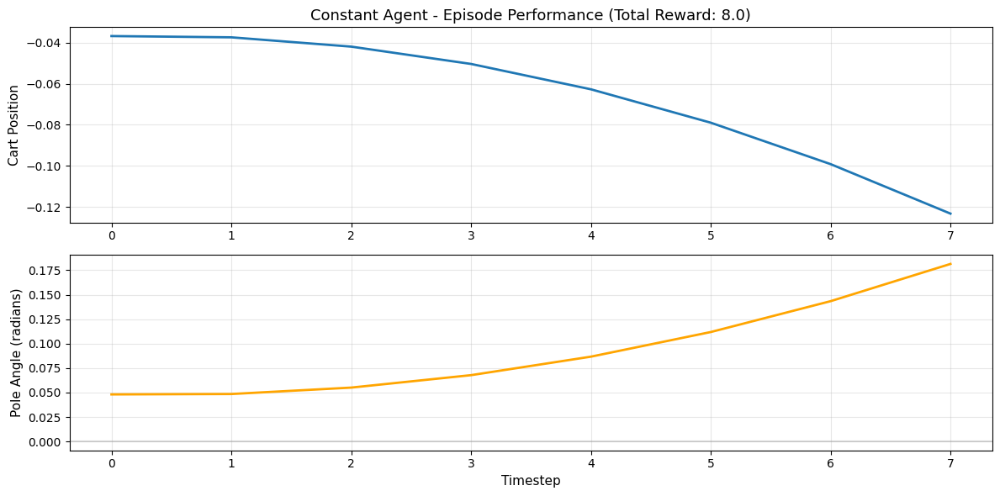

In [24]:
# Plot statistics
plot_episode_stats(constant_agent, "Constant Agent")


## Exercise 3: Design Your Own Heuristic Agent

Now try to design a smarter agent that uses the observation to make decisions!

**Observation components** (reminder):
- `observation[0]`: Cart position
- `observation[1]`: Cart velocity
- `observation[2]`: Pole angle (in radians)
- `observation[3]`: Pole angular velocity

**Some ideas to explore**:
- Push in the direction the pole is leaning
- Consider the pole's angular velocity
- Try to keep the cart centered
- Use a combination of multiple observation features

**Challenge**: Can you create a heuristic that achieves 200+ reward consistently?


In [25]:
def heuristic_agent(observation: np.ndarray) -> int:
    """
    Design your own heuristic agent!
    
    Args:
        observation: [cart_pos, cart_vel, pole_angle, pole_angular_vel]
        
    Returns:
        action: 0 (left) or 1 (right)
    """
    # Strategy: Consider both the pole angle and angular velocity
    # If the pole is leaning right or falling right, push right
    # If the pole is leaning left or falling left, push left
    
    pole_angle = observation[2]
    pole_velocity = observation[3]
    
    # Combine angle and velocity for better prediction
    # The coefficient 0.3 weights the angular velocity
    combined = pole_angle + 0.3 * pole_velocity
    
    if combined > 0:
        return 1  # Push right
    else:
        return 0  # Push left

In [ ]:
# Render your heuristic agent
render_episode(heuristic_agent, "Heuristic Agent")

# May take some time - if your agent is good. : )


ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1342:(snd_func_refer) error evaluating name
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5727:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2721:(snd_pcm_open_noupdate) Unknown PCM default


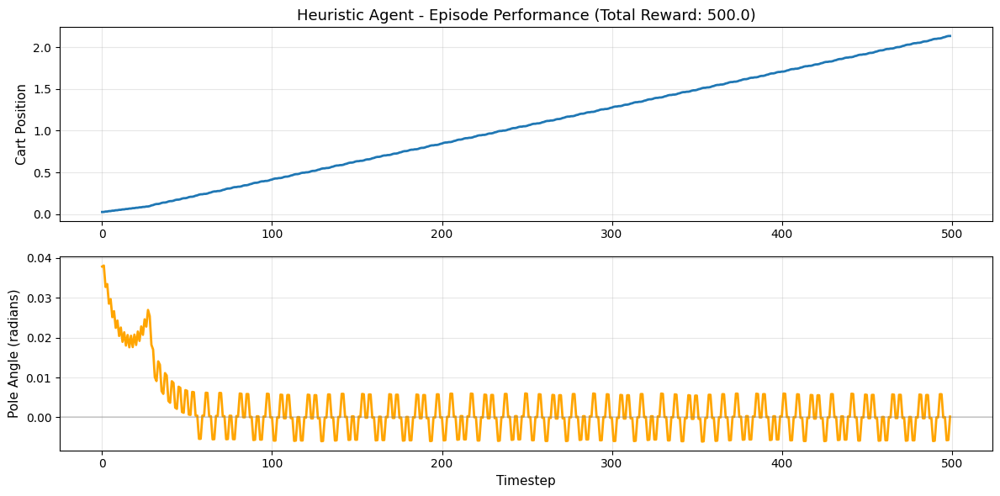

In [27]:
# Plot statistics
plot_episode_stats(heuristic_agent, "Heuristic Agent")

# Pytorch Neural Networks

Feel free to skip this section (to "putting it all together") if you're familiar with Pytorch.

Before we can learn policies with neural networks, we need to understand how PyTorch enables us to compute gradients automatically.

## Neural Networks as Parameterized Functions

A neural network is simply a function $f_\theta(x)$ where:
- $x$ is the input (e.g., an observation)
- $\theta$ are the parameters (weights and biases)
- $f_\theta(x)$ is the output (e.g., action probabilities)

The key insight: we can compute $\nabla_\theta f_\theta(x)$ (the gradient with respect to parameters) automatically using **backpropagation**.


In [28]:
import torch
import torch.nn as nn
import torch.nn.functional as F

## Defining a Simple Network

Let's create a simple feedforward network:


In [29]:
class SimpleNetwork(nn.Module):
    def __init__(self, input_size: int, hidden_size: int, output_size: int):
        super().__init__()
        # Create two linear layers (nn.Linear) and store them as class attributes
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        x = F.relu(self.fc1(x))  # First layer + activation
        x = self.fc2(x)          # Output layer
        return x

# Create a network: 4 inputs -> 16 hidden -> 2 outputs
net = SimpleNetwork(input_size=4, hidden_size=16, output_size=2)
print(net)

SimpleNetwork(
  (fc1): Linear(in_features=4, out_features=16, bias=True)
  (fc2): Linear(in_features=16, out_features=2, bias=True)
)


## Forward Pass: Computing $f_\theta(x)$

The forward pass computes the output for a given input:


In [30]:
# Create a dummy input (batch of 1, with 4 features)
x = torch.tensor([[0.1, 0.2, 0.3, 0.4]])

# Forward pass: compute f_θ(x)
output = net(x)
print(f"Input shape: {x.shape}")
print(f"Output shape: {output.shape}")
print(f"Output: {output}")

Input shape: torch.Size([1, 4])
Output shape: torch.Size([1, 2])
Output: tensor([[0.5105, 0.0703]], grad_fn=<AddmmBackward0>)


## Backward Pass: Computing $\nabla_\theta f_\theta(x)$

PyTorch's `.backward()` computes gradients automatically using the chain rule.

Here's the key connection to math:
- When we call `loss.backward()`, PyTorch computes $\nabla_\theta L$ where $L$ is our loss function
- These gradients tell us how to adjust $\theta$ to decrease the loss

Note that the gradient with respect to $\theta$ is always the same shape as $\theta$; if $\theta$ is a vector, $\nabla_\theta f$ is a vector of the same size, and if it's a tensor, $\nabla_\theta f$ is a tensor of the same shape.


In [31]:
# Create a simple loss (e.g., mean of outputs)
loss = output.mean()
print(f"Loss: {loss.item()}")

# Before backward: gradients are None
print(f"\nGradient of fc1.weight before backward: {net.fc1.weight.grad}")

# Compute gradients: ∇_θ loss
loss.backward()

# After backward: gradients are computed!
print(f"Gradient of fc1.weight after backward:")
print(net.fc1.weight.grad)
print(f"Shape: {net.fc1.weight.grad.shape}")


Loss: 0.290371835231781

Gradient of fc1.weight before backward: None
Gradient of fc1.weight after backward:
tensor([[7.4519e-05, 1.4904e-04, 2.2356e-04, 2.9808e-04],
        [2.4789e-03, 4.9579e-03, 7.4368e-03, 9.9158e-03],
        [6.5080e-03, 1.3016e-02, 1.9524e-02, 2.6032e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [3.7492e-03, 7.4983e-03, 1.1247e-02, 1.4997e-02],
        [3.0143e-03, 6.0287e-03, 9.0430e-03, 1.2057e-02],
        [3.3523e-03, 6.7046e-03, 1.0057e-02, 1.3409e-02],
        [4.7808e-03, 9.5616e-03, 1.4342e-02, 1.9123e-02],
        [6.2063e-03, 1.2413e-02, 1.8619e-02, 2.4825e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [1.0311e-02, 2.0621e-02, 3.0932e-02, 4.1243e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00],
        [0.0000e+00, 

## Optimizers: Using Gradients to Update Parameters

Once we have gradients, we use an optimizer to update parameters:

$$\theta_{new} = \theta_{old} - \alpha \nabla_\theta L$$

where $\alpha$ is the learning rate.


In [32]:
# Create an optimizer
optimizer = torch.optim.Adam(net.parameters(), lr=0.01)

# Training loop pattern:
# 1. Zero out old gradients
optimizer.zero_grad()

# 2. Forward pass
output = net(x)
loss = output.mean()

# 3. Backward pass: compute ∇_θ loss
loss.backward()

# 4. Update parameters: θ_new = θ_old - α * ∇_θ loss
optimizer.step()

print("Parameters updated!")


Parameters updated!


Consider: 

1. Why do we *subtract* the gradient of the loss?
2. What's $\alpha$ used for?

# Putting It All Together: Neural Network Agent

Now let's combine everything: we'll create a policy network for CartPole and see how to train it!


## Step 1: Define a Policy Network

For CartPole:
- **Input**: 4-dimensional observation (cart position, cart velocity, pole angle, pole angular velocity)
- **Output**: 2-dimensional action probabilities (left, right)


In [33]:
class PolicyNetwork(nn.Module):
    def __init__(self, obs_size, hidden_size, action_size):
        super().__init__()
        self.fc1 = nn.Linear(obs_size, hidden_size)  # Input layer: obs_size -> hidden_size
        self.fc2 = nn.Linear(hidden_size, action_size)  # Output layer: hidden_size -> action_size
    
    def forward(self, x):
        """
        Forward pass through the network.
        
        Args:
            x: observation tensor of shape (batch_size, obs_size)
            
        Returns:
            action_probs: probability distribution over actions
        """
        x = F.relu(self.fc1(x))
        logits = self.fc2(x)
        # Convert logits to probabilities using softmax
        action_probs = F.softmax(logits, dim=-1)
        return action_probs

# Create the policy network for CartPole
env = gym.make("CartPole-v1")
obs_size = env.observation_space.shape[0]  # 4
action_size = env.action_space.n  # 2

policy_net = PolicyNetwork(obs_size=obs_size, hidden_size=32, action_size=action_size)
print(f"Policy network created: {obs_size} -> 32 -> {action_size}")

Policy network created: 4 -> 32 -> 2


## Step 2: Create an Agent Using the Network

We'll create an agent that samples actions from the network's output distribution:


In [34]:
class NeuralAgent:
    def __init__(self, policy_network):
        self.policy_net = policy_network
    
    def __call__(self, observation: np.ndarray) -> int:
        """
        Select an action based on the current observation.
        
        Args:
            observation: numpy array of shape (obs_size,)
            
        Returns:
            action: integer action (0 or 1 for CartPole)
        """
        # Convert observation to tensor
        obs_tensor = torch.tensor(observation, dtype=torch.float32).unsqueeze(0)  # Add batch dimension
        
        # Get action probabilities from network (no gradient needed for sampling)
        with torch.no_grad():
            action_probs = self.policy_net(obs_tensor)
        
        # Sample an action from the probability distribution
        action = torch.multinomial(action_probs, num_samples=1).item()
        
        return action

# Create an agent with our untrained network
neural_agent = NeuralAgent(policy_net)


Let's see how the untrained agent performs:


In [35]:
# Test the untrained agent
obs, actions, rewards, total_reward = run_episode(env, neural_agent)
print(f"Untrained agent reward: {total_reward}")

# Render it
render_episode(neural_agent, "Untrained Neural Agent")


Untrained agent reward: 19.0


ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1342:(snd_func_refer) error evaluating name
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5727:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2721:(snd_pcm_open_noupdate) Unknown PCM default


## Step 3: Collect Trajectories

Before training, we need to collect experience from the environment:


In [44]:
# Collect one episode
observations, actions, rewards, total_reward = run_episode(env, neural_agent)
print(f"Collected {len(observations)} transitions")
print(f"Total reward: {total_reward}")

Collected 500 transitions
Total reward: 500.0


## Step 4: Implement a Training Step (Exercise)

Now it's your turn! We'll first implement a reward to go computation, which calculates the sum of all rewards from the present timestep until the trajectory's termination. For why we calculate this, refer to the derivation in `policygradient.ipynb` (week 2 reading).

In [45]:
def compute_rewards_to_go(rewards: list[float], gamma: float = 0.99) -> list[float]:
    """
    Compute the discounted reward-to-go for each timestep.
    
    Args:
        rewards: list of rewards [r_0, r_1, ..., r_{T-1}]
        gamma: discount factor
        
    Returns:
        rewards_to_go: list where rewards_to_go[t] = sum_{t'=t}^{T-1} gamma^{t'-t} * r_{t'}
    """
    T = len(rewards)
    rewards_to_go = [0] * T
    
    # Work backwards from the end
    rewards_to_go[T-1] = rewards[T-1]
    
    for t in range(T-2, -1, -1):  # From T-2 down to 0
        rewards_to_go[t] = rewards[t] + gamma * rewards_to_go[t+1]
    
    return rewards_to_go

# Test with simple example
test_rewards = [1, 1, 1, 10]
rtg = compute_rewards_to_go(test_rewards, gamma=0.9)
print(f"Rewards: {test_rewards}")
print(f"Rewards-to-go: {rtg}")


Rewards: [1, 1, 1, 10]
Rewards-to-go: [10.0, 10.0, 10.0, 10]


## Step 4: Implement REINFORCE Training Step

Now implement the REINFORCE policy gradient! The loss function is:

$$L = -\frac{1}{N}\sum_{i=1}^{N} \sum_{t=0}^{T_i-1} \log \pi_\theta(a_{i,t} | s_{i,t}) \hat{R}_{i,t}$$

where:
- $N$ is the number of trajectories (in our case, we flatten all transitions)
- $\pi_\theta(a_t | s_t)$ is the probability the policy assigns to action $a_t$ given state $s_t$
- $\hat{R}_t$ is the reward-to-go from timestep $t$

**Key insight**: When we minimize this loss with gradient descent, we're doing gradient *ascent* on the expected return!


In [47]:
def train_step(policy_net, optimizer, observations, actions, rewards, gamma=0.99):
    """
    Perform one REINFORCE training step on the policy network.
    
    Args:
        policy_net: the policy network
        optimizer: PyTorch optimizer
        observations: list of observation arrays
        actions: list of actions taken
        rewards: list of rewards received
        gamma: discount factor for reward-to-go
        
    Returns:
        loss: the computed loss value
    """
    # 1. Compute rewards-to-go
    rewards_to_go = compute_rewards_to_go(rewards, gamma)
    
    # 2-4. Convert to tensors
    obs_tensor = torch.tensor(np.array(observations), dtype=torch.float32)
    action_tensor = torch.tensor(actions, dtype=torch.long)
    rtg_tensor = torch.tensor(rewards_to_go, dtype=torch.float32)
    
    # 5. Get action probabilities from network
    action_probs = policy_net(obs_tensor)
    
    # 6. Get probabilities of actions actually taken
    # gather selects the probability of the action that was actually taken
    taken_action_probs = action_probs.gather(1, action_tensor.unsqueeze(1)).squeeze()
    
    # 7. Compute log probabilities (add small epsilon for numerical stability)
    log_probs = torch.log(taken_action_probs + 1e-10)
    
    # 8. Compute REINFORCE loss: -E[log π(a|s) * R]
    loss = -(log_probs * rtg_tensor).mean()
    
    # 9. Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # 10. Return loss value
    return loss.item()

# Test your implementation
optimizer = torch.optim.Adam(policy_net.parameters(), lr=0.01)
loss = train_step(policy_net, optimizer, observations, actions, rewards)
print(f"Loss after training step: {loss:.4f}")


Loss after training step: 42.2538


## Full Training Loop (Optional Challenge)

Once you've implemented `train_step`, try creating a full training loop:


Episode 0: Reward = 28.00, Loss = 9.1736
Episode 20: Reward = 35.00, Loss = 10.8962
Episode 40: Reward = 10.00, Loss = 3.7668
Episode 60: Reward = 35.00, Loss = 11.3378
Episode 80: Reward = 40.00, Loss = 11.7838
Episode 100: Reward = 19.00, Loss = 5.7474
Episode 120: Reward = 39.00, Loss = 10.5758
Episode 140: Reward = 52.00, Loss = 12.4450
Episode 160: Reward = 108.00, Loss = 21.2358
Episode 180: Reward = 84.00, Loss = 18.9346


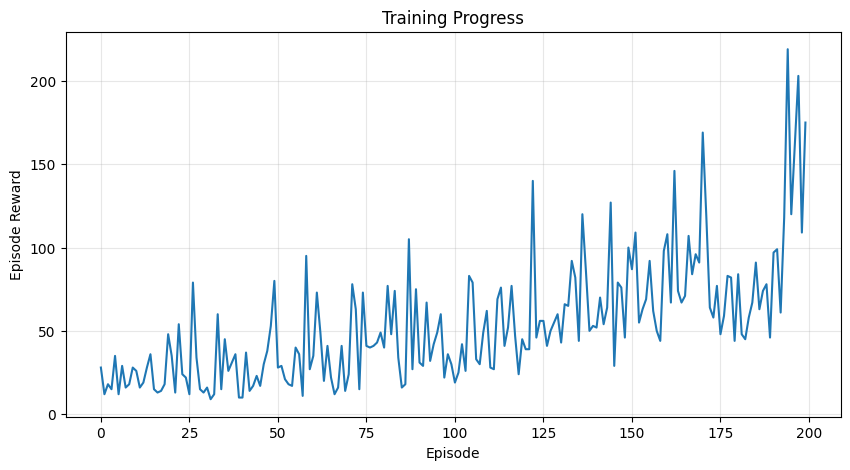

ALSA lib confmisc.c:855:(parse_card) cannot find card '0'
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_card_inum returned error: No such file or directory
ALSA lib confmisc.c:422:(snd_func_concat) error evaluating strings
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1342:(snd_func_refer) error evaluating name
ALSA lib conf.c:5204:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5727:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2721:(snd_pcm_open_noupdate) Unknown PCM default


In [48]:
# Full training loop 

num_episodes = 200

policy_net = PolicyNetwork(obs_size=obs_size, hidden_size=32, action_size=action_size)
optimizer = torch.optim.Adam(policy_net.parameters(), lr=0.01)
neural_agent = NeuralAgent(policy_net)

episode_rewards = []

for episode in range(num_episodes):
    # Collect one episode
    observations, actions, rewards, total_reward = run_episode(env, neural_agent)
    
    # Train on this episode
    loss = train_step(policy_net, optimizer, observations, actions, rewards)
    
    # Track progress
    episode_rewards.append(total_reward)
    
    if episode % 20 == 0:
        print(f"Episode {episode}: Reward = {total_reward:.2f}, Loss = {loss:.4f}")

# Plot training progress
plt.figure(figsize=(10, 5))
plt.plot(episode_rewards)
plt.xlabel('Episode')
plt.ylabel('Episode Reward')
plt.title('Training Progress')
plt.grid(True, alpha=0.3)
plt.show()

# Render the trained agent
render_episode(neural_agent, "Trained Neural Agent")

**Congratulations!** You've just implemented REINFORCE, one of the foundational policy gradient algorithms!

This implementation includes the core concepts, but there are additional improvements you'll learn about later:
- **Baselines**: Reducing variance in gradient estimates by subtracting a baseline from rewards
- **Entropy bonuses**: Encouraging exploration by adding an entropy term to the loss
- **Generalized Advantage Estimation (GAE)**: A more sophisticated way to estimate advantages

These refinements can significantly improve training stability and performance!


In [49]:
# Clean up
env.close()